### Imports

In [4]:
!pip install mlflow dagshub optuna

In [5]:
import optuna
import mlflow
import mlflow.sklearn
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

### Experiment Tracking Server

In [6]:
import dagshub
dagshub.init(repo_owner='dakshvandanarathi', repo_name='YT-Sentiment-Analyser', mlflow=True)

❗❗❗ AUTHORIZATION REQUIRED ❗❗❗

Output()



Open the following link in your browser to authorize the client:
https://dagshub.com/login/oauth/authorize?state=f934588c-7e7e-4f8d-835a-cf3504dd7e48&client_id=32b60ba385aa7cecf24046d8195a71c07dd345d9657977863b52e7748e0f0f28&middleman_request_id=b2758f44b96eee31477c1ee17cfdf17cd3320f29894a09cdd3a55c1268315c70




Accessing as dakshvandanarathi

Initialized MLflow to track repo "dakshvandanarathi/YT-Sentiment-Analyser"

Repository dakshvandanarathi/YT-Sentiment-Analyser initialized!

In [7]:
# Set or create an experiment
mlflow.set_experiment("Exp 5 - LightGBM HP Tuning")

<Experiment: artifact_location='mlflow-artifacts:/ab21ad30180544be93affae05d820d78', creation_time=1730006156144, experiment_id='6', last_update_time=1730006156144, lifecycle_stage='active', name='Exp 5 - LightGBM HP Tuning', tags={}>

### Helper Functions

In [8]:
# Define a function to vectorize the data using TF-IDF
def vectorize_data(X_train, X_val, X_test, max_features, ngram_range):
    vectorizer = TfidfVectorizer(max_features=max_features, ngram_range=ngram_range)
    X_train_vec = vectorizer.fit_transform(X_train['comment']).toarray()
    X_val_vec = vectorizer.transform(X_val['comment']).toarray()
    X_test_vec = vectorizer.transform(X_test['comment']).toarray()

    # Combine additional features
    X_train_combined = np.hstack([X_train_vec, X_train[['word_count', 'char_count', 'avg_word_length']].values])
    X_val_combined = np.hstack([X_val_vec, X_val[['word_count', 'char_count', 'avg_word_length']].values])
    X_test_combined = np.hstack([X_test_vec, X_test[['word_count', 'char_count', 'avg_word_length']].values])

    return X_train_combined, X_val_combined, X_test_combined


# Define the function that evaluates the model on validation data
def evaluate_model(model, X_val, y_val):
    y_val_pred = model.predict(X_val)  # Predict on validation set
    f1 = f1_score(y_val, y_val_pred, average='macro', zero_division=0)  # Calculate F1 (macro)
    accuracy = accuracy_score(y_val, y_val_pred)  # Calculate accuracy
    return f1, accuracy, y_val_pred

### Read and Vectorize Data

In [9]:
df = pd.read_csv('/content/preprocessed_data.csv').dropna()

# Remap the class labels from [-1, 0, 1] to [0, 1, 2]
df['category'] = df['category'].map({-1: 0, 0: 1, 1: 2})

df.shape

(36662, 5)

In [10]:
max_features = 9410
ngram_range = (1, 2)

# Split data into training, validation and testing sets
X = df[['comment', 'word_count', 'char_count', 'avg_word_length']]
y = df['category']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.4, random_state=42, stratify=y_temp)

In [11]:
# Vectorize the data
X_train_combined, X_val_combined, X_test_combined = vectorize_data(X_train, X_val, X_test, max_features, ngram_range)

### HP Tuning using Optuna

In [12]:
# Define the Optuna objective function for LightGBM
def objective_lgbm(trial):

    n_estimators = trial.suggest_int("n_estimators", 150, 1000, step=10)
    max_depth = trial.suggest_int("max_depth", 3, 25)
    learning_rate = trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True)
    num_leaves = trial.suggest_int("num_leaves", 20, 150)
    min_child_samples = trial.suggest_int("min_child_samples", 5, 100)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-8, 10.0, log=True)

    # Initialize LightGBM model with GPU support
    model = lgb.LGBMClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        num_leaves=num_leaves,
        min_child_samples=min_child_samples,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        objective='multiclass',
        num_class=3,
        class_weight='balanced',
        random_state=42
    )

    # Log each trial to MLflow
    trial_name = f"trial-{trial.number + 1}"
    with mlflow.start_run(run_name=trial_name):
        # Fit the model on the training data
        model.fit(X_train_combined, y_train)

        # Evaluate model on the validation set
        f1, accuracy, y_val_pred = evaluate_model(model, X_val_combined, y_val)

        # Log hyperparameters and metrics to MLflow
        mlflow.log_params({
            "n_estimators": n_estimators,
            "max_depth": max_depth,
            "learning_rate": learning_rate,
            "num_leaves": num_leaves,
            "min_child_samples": min_child_samples,
            "subsample": subsample,
            "colsample_bytree": colsample_bytree,
            "reg_alpha": reg_alpha,
            "reg_lambda": reg_lambda,
            "objective": 'multiclass',
            "num_class": 3,
            "class_weight": 'balanced',
            "random_state": 42
        })

        mlflow.log_metric("accuracy", accuracy)

        # Logging the classification report
        classification_rep = classification_report(y_val, y_val_pred, output_dict=True)
        for label, metrics in classification_rep.items():
            if isinstance(metrics, dict):  # For precision, recall, f1-score, etc.
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{label}_{metric}", value)

        # Confusion matrix plot
        conf_matrix = confusion_matrix(y_val, y_val_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")

        # Save and log the confusion matrix plot
        plt.savefig("confusion_matrix.png")
        mlflow.log_artifact("confusion_matrix.png")
        plt.close()

    return accuracy, f1

In [13]:
# Run Optuna optimization
study_lgbm = optuna.create_study(directions=["maximize", "maximize"], study_name="LightGBM_Optimization")  # Multi-objective optimization for both F1 and accuracy
study_lgbm.optimize(objective_lgbm, n_trials=150)

[I 2024-10-27 09:24:20,605] A new study created in memory with name: LightGBM_Optimization


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.321376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 09:25:10 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-1 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/a1a65b07ce5740bd89ce689d5146ef51.
2024/10/27 09:25:10 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:25:10,333] Trial 0 finished with values: [0.8136024731769412, 0.7992487317690343] and parameters: {'n_estimators': 480, 'max_depth': 7, 'learning_rate': 0.059448983760553464, 'num_leaves': 114, 'min_child_samples': 47, 'subsample': 0.8892902177300896, 'colsample_bytree': 0.7026462235147206, 'reg_alpha': 1.5867441325781595, 'reg_lambda': 0.3924829976795518}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.642750 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 09:26:16 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-2 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/a4f38786cc22451583507ba6b8137dee.
2024/10/27 09:26:16 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:26:16,899] Trial 1 finished with values: [0.7910529187124932, 0.7769391697383767] and parameters: {'n_estimators': 300, 'max_depth': 16, 'learning_rate': 0.021236850921526513, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 2.9686468102715427e-06, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.871360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 09:27:40 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-3 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1207537418714050a3e5abb6b3d13326.
2024/10/27 09:27:40 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:27:40,461] Trial 2 finished with values: [0.7572285870158211, 0.7414431273928143] and parameters: {'n_estimators': 250, 'max_depth': 17, 'learning_rate': 0.013283597167670273, 'num_leaves': 98, 'min_child_samples': 21, 'subsample': 0.8721384068530394, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 0.2935560964008341, 'reg_lambda': 0.1489897747049956}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 3.518746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 150073
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 9001
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 09:31:47 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-4 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/cbdd98a26d4d4c45b79aa7bf9868b395.
2024/10/27 09:31:47 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:31:47,899] Trial 3 finished with values: [0.6059283506092017, 0.5917448213659976] and parameters: {'n_estimators': 480, 'max_depth': 10, 'learning_rate': 0.00019806764041127017, 'num_leaves': 89, 'min_child_samples': 6, 'subsample': 0.7706136915599443, 'colsample_bytree': 0.9832356865394278, 'reg_alpha': 7.909213758416286e-08, 'reg_lambda': 7.906194920936583e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.277834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 92331
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1526
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 09:32:47 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-5 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/eb2de5cac2c141cf94d272a49d709a70.
2024/10/27 09:32:47 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:32:47,570] Trial 4 finished with values: [0.6342971449354428, 0.6215618844687515] and parameters: {'n_estimators': 360, 'max_depth': 11, 'learning_rate': 0.0016065728854238568, 'num_leaves': 102, 'min_child_samples': 56, 'subsample': 0.8596471158682379, 'colsample_bytree': 0.9493739052486089, 'reg_alpha': 0.013956039108357824, 'reg_lambda': 1.5871354562695052e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.175049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 78993
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 09:34:07 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-6 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/7100719061fe4e24884004b72c9d40fd.
2024/10/27 09:34:07 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:34:08,040] Trial 5 finished with values: [0.7821422076741226, 0.7649019569797314] and parameters: {'n_estimators': 640, 'max_depth': 18, 'learning_rate': 0.01557631478265743, 'num_leaves': 132, 'min_child_samples': 88, 'subsample': 0.5494012527981158, 'colsample_bytree': 0.84133790364606, 'reg_alpha': 3.544940624222437e-08, 'reg_lambda': 2.39748752560375e-05}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.122624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 110943
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2791
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 09:37:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-7 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/8f98778e023849108f37642db20db81e.
2024/10/27 09:37:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:37:14,564] Trial 6 finished with values: [0.7605019094380796, 0.7443482950443862] and parameters: {'n_estimators': 750, 'max_depth': 15, 'learning_rate': 0.005403229117018063, 'num_leaves': 80, 'min_child_samples': 30, 'subsample': 0.5256401423622141, 'colsample_bytree': 0.5235374852565029, 'reg_alpha': 4.820687377140407e-08, 'reg_lambda': 0.2977741301316604}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.285812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93749
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1599
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 09:39:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-8 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/eae8a8963be0422c99fd6327b0b733c5.
2024/10/27 09:39:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:39:23,123] Trial 7 finished with values: [0.7355882887797781, 0.719704789306812] and parameters: {'n_estimators': 970, 'max_depth': 11, 'learning_rate': 0.0041443970439407896, 'num_leaves': 80, 'min_child_samples': 53, 'subsample': 0.9132824928538694, 'colsample_bytree': 0.8162922650649095, 'reg_alpha': 0.001984738885854387, 'reg_lambda': 0.0009737888564618128}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.562494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 106848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2447
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 09:41:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-9 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/82c60ee3df284d8eb48af1af24fdf7f5.
2024/10/27 09:41:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:41:54,362] Trial 8 finished with values: [0.8483360611020185, 0.8337643922884871] and parameters: {'n_estimators': 860, 'max_depth': 20, 'learning_rate': 0.050678033588595926, 'num_leaves': 38, 'min_child_samples': 35, 'subsample': 0.9145761030026635, 'colsample_bytree': 0.830021886075313, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.963823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 09:43:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-10 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0c182d4249f048c39b58dbc9243d4423.
2024/10/27 09:43:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:43:54,488] Trial 9 finished with values: [0.8574286233860702, 0.8444839861540504] and parameters: {'n_estimators': 560, 'max_depth': 17, 'learning_rate': 0.040414882180645394, 'num_leaves': 53, 'min_child_samples': 23, 'subsample': 0.5510086426844962, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 3.496488898938256e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.287519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 90809
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1451
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 09:44:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-11 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/f7522f4771ea4b75afc58feb6cf52f28.
2024/10/27 09:44:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:44:26,432] Trial 10 finished with values: [0.5559192580469177, 0.5463556708647563] and parameters: {'n_estimators': 400, 'max_depth': 4, 'learning_rate': 0.0014447607522430567, 'num_leaves': 88, 'min_child_samples': 59, 'subsample': 0.5870451341056265, 'colsample_bytree': 0.6126374162784665, 'reg_alpha': 1.3613570422421183e-05, 'reg_lambda': 0.5618119204524221}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.155263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 75097
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 858
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 09:46:00 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-12 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/26bbe08a169b4bd7a679ddad556bbe49.
2024/10/27 09:46:00 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:46:00,848] Trial 11 finished with values: [0.6493907983269686, 0.6341146316768576] and parameters: {'n_estimators': 730, 'max_depth': 18, 'learning_rate': 0.001319168114766777, 'num_leaves': 115, 'min_child_samples': 100, 'subsample': 0.596405938922238, 'colsample_bytree': 0.7463601594542517, 'reg_alpha': 0.003318523082031044, 'reg_lambda': 4.7120067719623255e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.220580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 81236
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1054
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 09:47:08 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-13 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/5df26b0855934700b273de9d9ac57ecd.
2024/10/27 09:47:08 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:47:08,837] Trial 12 finished with values: [0.6533915257319513, 0.6366311033368596] and parameters: {'n_estimators': 390, 'max_depth': 23, 'learning_rate': 0.0008988716257432756, 'num_leaves': 112, 'min_child_samples': 82, 'subsample': 0.6881021273261207, 'colsample_bytree': 0.5269714144526633, 'reg_alpha': 0.00022519790574569584, 'reg_lambda': 0.0025331739124138494}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.687963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 132233
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 5400
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 09:50:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-14 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/abb267cc802f4fc3964283200faa8db8.
2024/10/27 09:50:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:50:47,061] Trial 13 finished with values: [0.8370612838697945, 0.8234650644768036] and parameters: {'n_estimators': 980, 'max_depth': 18, 'learning_rate': 0.024477593207540647, 'num_leaves': 74, 'min_child_samples': 15, 'subsample': 0.8296381730713576, 'colsample_bytree': 0.7975579043039835, 'reg_alpha': 4.070568483742997, 'reg_lambda': 0.004711563262674235}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.158017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76014
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 885
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 09:51:21 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-15 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2537617b60544ea28f6c79180cb3056c.
2024/10/27 09:51:21 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:51:21,119] Trial 14 finished with values: [0.6326604837243135, 0.6172137415672755] and parameters: {'n_estimators': 180, 'max_depth': 24, 'learning_rate': 0.0004169848625170744, 'num_leaves': 107, 'min_child_samples': 98, 'subsample': 0.6899573746412544, 'colsample_bytree': 0.6356267890716842, 'reg_alpha': 5.4263442297477167e-08, 'reg_lambda': 3.148766076974008e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.436134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 128694
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4854
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 09:58:15 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-16 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9ff879c96bcc49c2a5016683a3000e49.
2024/10/27 09:58:15 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 09:58:16,089] Trial 15 finished with values: [0.7923258774322605, 0.7775346384966415] and parameters: {'n_estimators': 980, 'max_depth': 20, 'learning_rate': 0.004990518602260542, 'num_leaves': 119, 'min_child_samples': 17, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.944449428375792, 'reg_alpha': 0.018279126993251665, 'reg_lambda': 0.0005919096233992369}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.824855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 120573
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3778
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:01:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-17 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0e44f53e57254bdabc16cda0dcc44c1f.
2024/10/27 10:01:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:01:58,897] Trial 16 finished with values: [0.7039461720312784, 0.6875259258389169] and parameters: {'n_estimators': 480, 'max_depth': 24, 'learning_rate': 0.00030248370346467273, 'num_leaves': 122, 'min_child_samples': 22, 'subsample': 0.5449473025141497, 'colsample_bytree': 0.8189376977308436, 'reg_alpha': 2.622710861524355e-07, 'reg_lambda': 3.1952376844031044e-08}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.392978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 83905
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1153
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 10:02:57 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-18 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6d51153bb07444bc960c2fc761db87a0.
2024/10/27 10:02:57 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:02:57,885] Trial 17 finished with values: [0.5851973086015639, 0.5781790734738901] and parameters: {'n_estimators': 520, 'max_depth': 10, 'learning_rate': 0.0003265141110921847, 'num_leaves': 39, 'min_child_samples': 74, 'subsample': 0.9043162319213724, 'colsample_bytree': 0.9390339719335141, 'reg_alpha': 0.0003758999123906913, 'reg_lambda': 0.13536648439582266}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 3.327058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134518
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 5781
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:05:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-19 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/dc691dda098148d5840a14a09e91dd7b.
2024/10/27 10:05:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:05:17,409] Trial 18 finished with values: [0.6179305328241499, 0.6050187816013158] and parameters: {'n_estimators': 450, 'max_depth': 10, 'learning_rate': 0.0006537141514351804, 'num_leaves': 55, 'min_child_samples': 14, 'subsample': 0.7696774607766099, 'colsample_bytree': 0.9139141029950282, 'reg_alpha': 0.023703891469303587, 'reg_lambda': 0.19643956601317988}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.164180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 77113
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 918
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 10:06:11 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-20 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/5fdf6597422a45d9aa6010d884d94063.
2024/10/27 10:06:11 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:06:11,823] Trial 19 finished with values: [0.6921258410620112, 0.6751658901584491] and parameters: {'n_estimators': 900, 'max_depth': 7, 'learning_rate': 0.00479178392617794, 'num_leaves': 59, 'min_child_samples': 94, 'subsample': 0.7517051088955271, 'colsample_bytree': 0.7274496320044508, 'reg_alpha': 1.780929629081538e-07, 'reg_lambda': 4.744689956410109}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.215617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85248
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1206
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 10:06:44 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-21 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/ab52b5608c934169aecd4c1f659d900b.
2024/10/27 10:06:44 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:06:44,662] Trial 20 finished with values: [0.6552100381887616, 0.6368352030562395] and parameters: {'n_estimators': 170, 'max_depth': 22, 'learning_rate': 0.0004661706700788351, 'num_leaves': 73, 'min_child_samples': 71, 'subsample': 0.9653126342291365, 'colsample_bytree': 0.5006427244697521, 'reg_alpha': 2.3457780398142775e-06, 'reg_lambda': 0.1400460161421127}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.392635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 98403
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1862
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 10:07:22 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-22 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6a8f0673efac4a8c8b8e67e52e9eadba.
2024/10/27 10:07:22 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:07:22,301] Trial 21 finished with values: [0.5528277868703401, 0.5470369186373096] and parameters: {'n_estimators': 260, 'max_depth': 7, 'learning_rate': 0.00027309339697943605, 'num_leaves': 55, 'min_child_samples': 46, 'subsample': 0.6059976096405628, 'colsample_bytree': 0.9707520931764609, 'reg_alpha': 0.0037617783549673055, 'reg_lambda': 0.16826275496235077}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.184875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 77910
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 943
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 10:07:45 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-23 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1a15016750434b0080855a255e5b2630.
2024/10/27 10:07:45 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:07:45,196] Trial 22 finished with values: [0.5651936715766503, 0.5586920521211652] and parameters: {'n_estimators': 200, 'max_depth': 8, 'learning_rate': 0.0006010723761009535, 'num_leaves': 147, 'min_child_samples': 91, 'subsample': 0.9546504311692738, 'colsample_bytree': 0.9807250800528493, 'reg_alpha': 0.012342483046904414, 'reg_lambda': 2.3746708010977975e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85671
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1223
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 10:09:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-24 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/ad63dbff2963455b8408d8330bf19be1.
2024/10/27 10:09:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:09:58,489] Trial 23 finished with values: [0.6532096744862702, 0.637259852015935] and parameters: {'n_estimators': 980, 'max_depth': 19, 'learning_rate': 0.00014509950175574865, 'num_leaves': 43, 'min_child_samples': 70, 'subsample': 0.697904175808401, 'colsample_bytree': 0.5877129476404724, 'reg_alpha': 0.34214729804720817, 'reg_lambda': 0.488234916522338}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.175911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 78993
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 10:10:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-25 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/05f54201e580453985f1bd6e9f54b426.
2024/10/27 10:10:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:10:29,356] Trial 24 finished with values: [0.7728677941443899, 0.7551321252624974] and parameters: {'n_estimators': 190, 'max_depth': 19, 'learning_rate': 0.03658045471657857, 'num_leaves': 107, 'min_child_samples': 88, 'subsample': 0.8458953500969852, 'colsample_bytree': 0.8370362418320038, 'reg_alpha': 0.0347524903239303, 'reg_lambda': 0.008296131436355098}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.294681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 91712
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1495
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:12:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-26 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6e43180396e041f0bdc5caa546044d07.
2024/10/27 10:12:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:12:17,955] Trial 25 finished with values: [0.607928714311693, 0.5963917540242244] and parameters: {'n_estimators': 730, 'max_depth': 10, 'learning_rate': 0.00020421590798742174, 'num_leaves': 125, 'min_child_samples': 57, 'subsample': 0.6830733258715331, 'colsample_bytree': 0.9069556030807246, 'reg_alpha': 0.026908394365936943, 'reg_lambda': 0.0001405071267817288}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.187854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80222
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1019
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:12:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-27 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/4f6c5e85e0a345e899e21cfa3aca4424.
2024/10/27 10:12:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:12:59,175] Trial 26 finished with values: [0.773595199127114, 0.756078106615114] and parameters: {'n_estimators': 340, 'max_depth': 13, 'learning_rate': 0.026698390055827075, 'num_leaves': 113, 'min_child_samples': 85, 'subsample': 0.8610003344937596, 'colsample_bytree': 0.5992346800242521, 'reg_alpha': 6.479452724192171e-08, 'reg_lambda': 0.04805336314264641}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.497637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101752
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2077
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 10:13:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-28 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/572f5a274c694bde9430d50bd30c6221.
2024/10/27 10:13:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:13:28,908] Trial 27 finished with values: [0.7666848517912348, 0.7511686916152067] and parameters: {'n_estimators': 310, 'max_depth': 5, 'learning_rate': 0.042597724081668745, 'num_leaves': 124, 'min_child_samples': 41, 'subsample': 0.6081138944661475, 'colsample_bytree': 0.8764437772302782, 'reg_alpha': 0.1386465301951314, 'reg_lambda': 1.5140979758143463e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76354
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 895
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 10:14:06 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-29 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/463ea1f99d5e472abbf622774debd7d1.
2024/10/27 10:14:06 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:14:06,262] Trial 28 finished with values: [0.5597381342062193, 0.5451189419908088] and parameters: {'n_estimators': 690, 'max_depth': 5, 'learning_rate': 0.0008872440755425778, 'num_leaves': 143, 'min_child_samples': 97, 'subsample': 0.6957766771741463, 'colsample_bytree': 0.811994770743186, 'reg_alpha': 1.6044738438521846, 'reg_lambda': 3.499022591242488}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.342114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 82376
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1095
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 10:14:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-30 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/e1609ca2627142f8b0dc65c1b29f8abd.
2024/10/27 10:14:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:14:37,243] Trial 29 finished with values: [0.7530460083651573, 0.7359602452471927] and parameters: {'n_estimators': 250, 'max_depth': 14, 'learning_rate': 0.0220291674523816, 'num_leaves': 103, 'min_child_samples': 78, 'subsample': 0.7053292706582769, 'colsample_bytree': 0.8395700609519231, 'reg_alpha': 3.08355366140476, 'reg_lambda': 6.739337167058711e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.269623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 89187
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1375
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:15:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-31 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9813b36c8b744e9588ddf5a2e8e63fb3.
2024/10/27 10:15:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:15:51,257] Trial 30 finished with values: [0.8026913984360793, 0.7864941021237538] and parameters: {'n_estimators': 630, 'max_depth': 22, 'learning_rate': 0.029613612842259204, 'num_leaves': 20, 'min_child_samples': 62, 'subsample': 0.5492932455323261, 'colsample_bytree': 0.9881459930822427, 'reg_alpha': 4.959190248366235, 'reg_lambda': 5.724444949382492e-08}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.692548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 105939
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2377
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 10:16:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-32 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/844fa824a884407797e40c81b5b0fa98.
2024/10/27 10:16:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:16:37,275] Trial 31 finished with values: [0.7665030005455538, 0.7510365075956537] and parameters: {'n_estimators': 230, 'max_depth': 10, 'learning_rate': 0.027665213711037525, 'num_leaves': 124, 'min_child_samples': 36, 'subsample': 0.9698970581212651, 'colsample_bytree': 0.6025196483259563, 'reg_alpha': 3.92327857102058e-07, 'reg_lambda': 0.0198482392562217}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.498722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87887
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1317
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:18:15 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-33 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0cd756cf9010408ea5a1e6b6ddea2afa.
2024/10/27 10:18:15 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:18:15,611] Trial 32 finished with values: [0.8030551009274414, 0.7863265746235163] and parameters: {'n_estimators': 510, 'max_depth': 24, 'learning_rate': 0.019735379191851504, 'num_leaves': 79, 'min_child_samples': 65, 'subsample': 0.5483030441492475, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 6.632816128795185e-07, 'reg_lambda': 0.0007063806098989537}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.328187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 78993
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 10:19:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-34 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/90aaa4da5f4d4c41847f96d225f1f50b.
2024/10/27 10:19:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:19:29,243] Trial 33 finished with values: [0.706855791962175, 0.6901410574484091] and parameters: {'n_estimators': 700, 'max_depth': 10, 'learning_rate': 0.004844302181544677, 'num_leaves': 57, 'min_child_samples': 88, 'subsample': 0.9402011525258799, 'colsample_bytree': 0.9076257459595352, 'reg_alpha': 2.0026115451315164e-07, 'reg_lambda': 1.4956190805026317e-05}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 3.413668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142780
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 7342
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 10:20:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-35 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c528f3eb399e4e1abccdaa282f1cc7b4.
2024/10/27 10:20:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:20:23,220] Trial 34 finished with values: [0.7334060738316057, 0.7172757712019543] and parameters: {'n_estimators': 160, 'max_depth': 6, 'learning_rate': 0.05031970184224244, 'num_leaves': 28, 'min_child_samples': 11, 'subsample': 0.6104929586886181, 'colsample_bytree': 0.5991374977840251, 'reg_alpha': 4.993340947657, 'reg_lambda': 1.337655281164183e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.391409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95152
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1675
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:21:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-36 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/283ac577205a4c68bcae0070d9678705.
2024/10/27 10:21:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:21:25,679] Trial 35 finished with values: [0.7986906710310966, 0.783527135766728] and parameters: {'n_estimators': 340, 'max_depth': 13, 'learning_rate': 0.027246398902958987, 'num_leaves': 116, 'min_child_samples': 51, 'subsample': 0.6832823461418294, 'colsample_bytree': 0.5882233058101681, 'reg_alpha': 8.725768051037398e-07, 'reg_lambda': 4.1916290895834615e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.157121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75097
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 858
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 10:22:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-37 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/e035fe2b90b047fd86b6f2040685df23.
2024/10/27 10:22:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:22:43,175] Trial 36 finished with values: [0.7757774140752864, 0.7575542981443504] and parameters: {'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.02833199328688821, 'num_leaves': 84, 'min_child_samples': 100, 'subsample': 0.8346126050731, 'colsample_bytree': 0.9842232130402259, 'reg_alpha': 0.00014349161389811687, 'reg_lambda': 1.9294458159542928e-08}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.411659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 85982
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1236
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 10:24:07 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-38 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/454272180fec4a37ab29052871748764.
2024/10/27 10:24:07 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:24:08,004] Trial 37 finished with values: [0.8032369521731224, 0.7858651414711826] and parameters: {'n_estimators': 780, 'max_depth': 14, 'learning_rate': 0.07586142647237526, 'num_leaves': 20, 'min_child_samples': 69, 'subsample': 0.7559138725570314, 'colsample_bytree': 0.9727074440777861, 'reg_alpha': 1.7996125478833814e-07, 'reg_lambda': 6.919820998268688e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.325031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 91292
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1474
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:25:33 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-39 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/77f021c572ee44339600bd1deb84df71.
2024/10/27 10:25:33 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:25:33,920] Trial 38 finished with values: [0.6659392616839426, 0.6497346997835473] and parameters: {'n_estimators': 440, 'max_depth': 15, 'learning_rate': 0.00098305220945448, 'num_leaves': 107, 'min_child_samples': 58, 'subsample': 0.5185005670092435, 'colsample_bytree': 0.509036962258705, 'reg_alpha': 3.35477522693038e-08, 'reg_lambda': 0.3573871692999044}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.682066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 95872
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1715
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:27:41 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-40 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/3cb58883d00d440f9bbb003d1b350b58.
2024/10/27 10:27:41 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:27:41,508] Trial 39 finished with values: [0.7132205855610111, 0.6953754441931692] and parameters: {'n_estimators': 670, 'max_depth': 25, 'learning_rate': 0.0021573215574105797, 'num_leaves': 42, 'min_child_samples': 50, 'subsample': 0.614319340570489, 'colsample_bytree': 0.806035125398592, 'reg_alpha': 3.193027416093186e-07, 'reg_lambda': 0.0013425360077083913}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.190232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 81236
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1054
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:28:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-41 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/7324110d94794d94b7d5edb557021c3b.
2024/10/27 10:28:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:28:29,504] Trial 40 finished with values: [0.789598108747045, 0.7725269353746432] and parameters: {'n_estimators': 440, 'max_depth': 16, 'learning_rate': 0.033986946192913745, 'num_leaves': 25, 'min_child_samples': 82, 'subsample': 0.718007835974316, 'colsample_bytree': 0.6111457171799165, 'reg_alpha': 1.0896920101542314e-07, 'reg_lambda': 0.00013855661437814712}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.671177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 105939
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2377
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:31:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-42 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2317402d205548f5b73ae7345c7ef221.
2024/10/27 10:31:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:31:25,970] Trial 41 finished with values: [0.6715766503000545, 0.6576761095434828] and parameters: {'n_estimators': 680, 'max_depth': 16, 'learning_rate': 0.0009324598355356938, 'num_leaves': 71, 'min_child_samples': 36, 'subsample': 0.7562361578251079, 'colsample_bytree': 0.9223096729938836, 'reg_alpha': 1.5105294406438514e-06, 'reg_lambda': 0.02837815439298117}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.215862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114352
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3112
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 10:32:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-43 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/3f88348bffa84d4d9b0e656c86f6fd66.
2024/10/27 10:32:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:32:26,035] Trial 42 finished with values: [0.6257501363884342, 0.6126290559544705] and parameters: {'n_estimators': 250, 'max_depth': 7, 'learning_rate': 0.0020155565117300424, 'num_leaves': 40, 'min_child_samples': 27, 'subsample': 0.7665994450015221, 'colsample_bytree': 0.5864816067896415, 'reg_alpha': 0.13760371950621617, 'reg_lambda': 5.619541677321884e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.276182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 75097
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 858
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 10:33:55 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-44 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/83ac4c1fc54648b2b152ddf58fecdc58.
2024/10/27 10:33:55 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:33:55,423] Trial 43 finished with values: [0.6348426986724859, 0.6197090646162299] and parameters: {'n_estimators': 560, 'max_depth': 21, 'learning_rate': 0.0002885201681023616, 'num_leaves': 113, 'min_child_samples': 100, 'subsample': 0.8743367726464835, 'colsample_bytree': 0.8939522903955286, 'reg_alpha': 0.12468088516463698, 'reg_lambda': 0.0006453377338919578}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.572262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103242
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2180
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 10:35:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-45 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1b031442bddd4cb2a6829fed2aee6a22.
2024/10/27 10:35:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:35:17,739] Trial 44 finished with values: [0.8412438625204582, 0.826962241252401] and parameters: {'n_estimators': 540, 'max_depth': 14, 'learning_rate': 0.05003392663022523, 'num_leaves': 74, 'min_child_samples': 39, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.6833847436695184, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 0.3760652280969855}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.508592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99586
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1936
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 10:37:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-46 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/51d0425da5194b01a0656a22bbd87fa2.
2024/10/27 10:37:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:37:37,783] Trial 45 finished with values: [0.7857792325877432, 0.770523797617762] and parameters: {'n_estimators': 990, 'max_depth': 16, 'learning_rate': 0.01012426838007348, 'num_leaves': 105, 'min_child_samples': 44, 'subsample': 0.6574084964930094, 'colsample_bytree': 0.9030448800837397, 'reg_alpha': 6.370946822594601, 'reg_lambda': 4.472083318041226e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.501187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123708
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4170
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 10:41:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-47 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/e2ba93c0ba7e4b8088d5bfd2d21fc030.
2024/10/27 10:41:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:41:46,877] Trial 46 finished with values: [0.8612474995453718, 0.846910050931993] and parameters: {'n_estimators': 970, 'max_depth': 20, 'learning_rate': 0.0665849462715659, 'num_leaves': 114, 'min_child_samples': 20, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.497000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123708
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4170
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:42:35 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-48 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/ca5f04454cc346e6a47aac58cc49df7a.
2024/10/27 10:42:35 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:42:35,338] Trial 47 finished with values: [0.6810329150754683, 0.6673902676458069] and parameters: {'n_estimators': 150, 'max_depth': 15, 'learning_rate': 0.004251815066410265, 'num_leaves': 52, 'min_child_samples': 20, 'subsample': 0.5587422667535207, 'colsample_bytree': 0.6922899874668074, 'reg_alpha': 1.2086342743991761e-08, 'reg_lambda': 0.4366976755833729}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 3.736939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146455
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 8079
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:53:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-49 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/e145a2a2fca74d458f6861899811b51c.
2024/10/27 10:53:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:53:51,842] Trial 48 finished with values: [0.7694126204764503, 0.7533967118703799] and parameters: {'n_estimators': 990, 'max_depth': 25, 'learning_rate': 0.002114197108576358, 'num_leaves': 91, 'min_child_samples': 10, 'subsample': 0.7660278106298277, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 9.523052562563493e-05, 'reg_lambda': 4.042413927735604e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.212120 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 77910
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 943
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:55:03 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-50 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d3f09ab2d07b4f8ab3e740702be1f942.
2024/10/27 10:55:03 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:55:03,760] Trial 49 finished with values: [0.6344789961811238, 0.6199869607138399] and parameters: {'n_estimators': 720, 'max_depth': 16, 'learning_rate': 0.0005039398515871244, 'num_leaves': 24, 'min_child_samples': 91, 'subsample': 0.5760987464212173, 'colsample_bytree': 0.601496423604564, 'reg_alpha': 9.417595264154639e-05, 'reg_lambda': 5.481063680572729e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.018909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 10:56:09 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-51 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2870dd6292504bcdb6d04416883e54fa.
2024/10/27 10:56:09 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:56:09,837] Trial 50 finished with values: [0.6692125841062011, 0.6546422839324878] and parameters: {'n_estimators': 300, 'max_depth': 15, 'learning_rate': 0.00098305220945448, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.5185005670092435, 'colsample_bytree': 0.509036962258705, 'reg_alpha': 2.9686468102715427e-06, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.219953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 10:59:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-52 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1b1d7f92d80f4721965f7b156c1aaa51.
2024/10/27 10:59:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 10:59:43,679] Trial 51 finished with values: [0.7583196944899072, 0.7422127956450263] and parameters: {'n_estimators': 560, 'max_depth': 20, 'learning_rate': 0.004990518602260542, 'num_leaves': 119, 'min_child_samples': 23, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 0.018279126993251665, 'reg_lambda': 0.0005919096233992369}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.083775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103242
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2180
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 11:00:40 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-53 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/58676b688ed7482d91c68df7291062fa.
2024/10/27 11:00:40 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:00:40,906] Trial 52 finished with values: [0.8277868703400618, 0.8137146244211028] and parameters: {'n_estimators': 250, 'max_depth': 17, 'learning_rate': 0.05003392663022523, 'num_leaves': 74, 'min_child_samples': 39, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 0.2935560964008341, 'reg_lambda': 0.1489897747049956}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.166737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 76014
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 885
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 11:01:15 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-54 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c66aa8a0041542f2ad2ed4edc2ee1934.
2024/10/27 11:01:15 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:01:15,107] Trial 53 finished with values: [0.6326604837243135, 0.6172137415672755] and parameters: {'n_estimators': 180, 'max_depth': 24, 'learning_rate': 0.0004169848625170744, 'num_leaves': 107, 'min_child_samples': 98, 'subsample': 0.6899573746412544, 'colsample_bytree': 0.6356267890716842, 'reg_alpha': 5.4263442297477167e-08, 'reg_lambda': 3.148766076974008e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.550278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101752
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2077
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:03:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-55 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/3f39cf9ec7d84ea5a0de20f06f32f084.
2024/10/27 11:03:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:03:24,035] Trial 54 finished with values: [0.8386979450809238, 0.8244359783048186] and parameters: {'n_estimators': 560, 'max_depth': 21, 'learning_rate': 0.042597724081668745, 'num_leaves': 113, 'min_child_samples': 41, 'subsample': 0.8743367726464835, 'colsample_bytree': 0.5353729486460743, 'reg_alpha': 0.1386465301951314, 'reg_lambda': 0.6563717475516665}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.201914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80222
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1019
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 11:04:04 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-56 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c80cb4f91f1940cf9f44dce132007f29.
2024/10/27 11:04:04 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:04:04,233] Trial 55 finished with values: [0.7728677941443899, 0.7555653747201102] and parameters: {'n_estimators': 340, 'max_depth': 13, 'learning_rate': 0.026698390055827075, 'num_leaves': 114, 'min_child_samples': 85, 'subsample': 0.8610003344937596, 'colsample_bytree': 0.6109927755209581, 'reg_alpha': 6.479452724192171e-08, 'reg_lambda': 0.04805336314264641}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.826299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 128694
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4854
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:09:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-57 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/ef6924ab8ccb41288abc4d220a044bb6.
2024/10/27 11:09:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:09:47,016] Trial 56 finished with values: [0.8581560283687943, 0.8433580065566756] and parameters: {'n_estimators': 980, 'max_depth': 24, 'learning_rate': 0.09528546084140699, 'num_leaves': 79, 'min_child_samples': 17, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 0.018279126993251665, 'reg_lambda': 0.0005919096233992369}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.175128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 77113
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 918
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 11:11:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-58 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9fbe9c6bfc6e4beea3b884cd9c2fc9fc.
2024/10/27 11:11:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:11:55,017] Trial 57 finished with values: [0.7535915621022004, 0.7353186815329297] and parameters: {'n_estimators': 900, 'max_depth': 20, 'learning_rate': 0.00479178392617794, 'num_leaves': 114, 'min_child_samples': 94, 'subsample': 0.7517051088955271, 'colsample_bytree': 0.7274496320044508, 'reg_alpha': 1.780929629081538e-07, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 2.211792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:14:13 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-59 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6fe115a5885a43e3b77ace82f23d04fa.
2024/10/27 11:14:13 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:14:13,779] Trial 58 finished with values: [0.8572467721403891, 0.8441040566276049] and parameters: {'n_estimators': 560, 'max_depth': 17, 'learning_rate': 0.040414882180645394, 'num_leaves': 53, 'min_child_samples': 23, 'subsample': 0.9653126342291365, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.1400460161421127}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.237275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 82376
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1095
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 11:14:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-60 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/beb6126ff9b344f4ac667045ce7ade04.
2024/10/27 11:14:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:15:00,070] Trial 59 finished with values: [0.6652118567012184, 0.6490632367481642] and parameters: {'n_estimators': 250, 'max_depth': 14, 'learning_rate': 0.00479178392617794, 'num_leaves': 103, 'min_child_samples': 78, 'subsample': 0.7517051088955271, 'colsample_bytree': 0.8395700609519231, 'reg_alpha': 1.780929629081538e-07, 'reg_lambda': 6.739337167058711e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.479365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 110943
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2791
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:17:52 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-61 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/088e883da3aa425181d49c1fba322fdd.
2024/10/27 11:17:52 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:17:52,565] Trial 60 finished with values: [0.7370430987452264, 0.7212999951813721] and parameters: {'n_estimators': 750, 'max_depth': 10, 'learning_rate': 0.005403229117018063, 'num_leaves': 57, 'min_child_samples': 30, 'subsample': 0.9402011525258799, 'colsample_bytree': 0.5235374852565029, 'reg_alpha': 2.0026115451315164e-07, 'reg_lambda': 1.4956190805026317e-05}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.051832 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:19:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-62 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9beee07325a743a3a940dac144cf870b.
2024/10/27 11:19:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:19:25,713] Trial 61 finished with values: [0.8321513002364066, 0.8183191471885402] and parameters: {'n_estimators': 300, 'max_depth': 16, 'learning_rate': 0.042597724081668745, 'num_leaves': 121, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 0.1386465301951314, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 2.275488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 120573
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3778
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 11:21:07 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-63 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0e3870889a6643c8b14afa52fbfd0c68.
2024/10/27 11:21:07 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:21:07,160] Trial 62 finished with values: [0.6999454446262957, 0.6833799785095476] and parameters: {'n_estimators': 190, 'max_depth': 24, 'learning_rate': 0.00030248370346467273, 'num_leaves': 122, 'min_child_samples': 22, 'subsample': 0.5186241712327959, 'colsample_bytree': 0.8189376977308436, 'reg_alpha': 0.0347524903239303, 'reg_lambda': 3.1952376844031044e-08}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.258376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 77910
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 943
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 11:23:13 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-64 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/5c2111423dcc4adaa46ec8efc09ae2d8.
2024/10/27 11:23:13 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:23:13,288] Trial 63 finished with values: [0.6395708310601927, 0.6239026578791003] and parameters: {'n_estimators': 720, 'max_depth': 18, 'learning_rate': 0.0005039398515871244, 'num_leaves': 115, 'min_child_samples': 91, 'subsample': 0.9749320391233236, 'colsample_bytree': 0.601496423604564, 'reg_alpha': 9.417595264154639e-05, 'reg_lambda': 4.7120067719623255e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.306442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 78993
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 11:23:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-65 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6b30f5f34a8945d38493a4541e857aa7.
2024/10/27 11:23:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:23:37,378] Trial 64 finished with values: [0.685033642480451, 0.6689182679646] and parameters: {'n_estimators': 310, 'max_depth': 5, 'learning_rate': 0.01557631478265743, 'num_leaves': 124, 'min_child_samples': 88, 'subsample': 0.6081138944661475, 'colsample_bytree': 0.966685710584015, 'reg_alpha': 0.00020336665432984445, 'reg_lambda': 1.5140979758143463e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 3.852735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146455
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 8079
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 11:28:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-66 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0e03ac1fe8a24afc8d18d9183ad6dbcd.
2024/10/27 11:28:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:28:51,432] Trial 65 finished with values: [0.7232224040734679, 0.7064922930691516] and parameters: {'n_estimators': 990, 'max_depth': 16, 'learning_rate': 0.002114197108576358, 'num_leaves': 39, 'min_child_samples': 10, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.7193075201910747, 'reg_alpha': 9.523052562563493e-05, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.500810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 11:29:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-67 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/fb1147715c85451782dbead7c7e6848f.
2024/10/27 11:29:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:29:28,304] Trial 66 finished with values: [0.8005091834879069, 0.7860603764432259] and parameters: {'n_estimators': 480, 'max_depth': 5, 'learning_rate': 0.059448983760553464, 'num_leaves': 124, 'min_child_samples': 47, 'subsample': 0.6081138944661475, 'colsample_bytree': 0.8764437772302782, 'reg_alpha': 1.5867441325781595, 'reg_lambda': 1.5140979758143463e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 83905
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1153
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 11:31:41 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-68 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/f0520769e1f64dcfa6b253784754b8aa.
2024/10/27 11:31:41 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:31:41,397] Trial 67 finished with values: [0.6306601200218221, 0.6178211484327338] and parameters: {'n_estimators': 970, 'max_depth': 10, 'learning_rate': 0.0003265141110921847, 'num_leaves': 114, 'min_child_samples': 74, 'subsample': 0.8361006938223663, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 0.0003758999123906913, 'reg_lambda': 0.0004986173491028025}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.690975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:33:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-69 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6ad014eeed6b402a9a8cb45acf992532.
2024/10/27 11:33:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:33:26,433] Trial 68 finished with values: [0.7743226041098381, 0.7591116012735876] and parameters: {'n_estimators': 270, 'max_depth': 20, 'learning_rate': 0.013283597167670273, 'num_leaves': 98, 'min_child_samples': 21, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.334192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2447
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 11:36:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-70 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0067aa1a4d2c4f70a82e2e1c5cebb213.
2024/10/27 11:36:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:36:29,674] Trial 69 finished with values: [0.8483360611020185, 0.8337643922884871] and parameters: {'n_estimators': 860, 'max_depth': 20, 'learning_rate': 0.050678033588595926, 'num_leaves': 38, 'min_child_samples': 35, 'subsample': 0.9145761030026635, 'colsample_bytree': 0.830021886075313, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.508870 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89187
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1375
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 11:38:04 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-71 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/e56a52ad3d244cabae1365ec5f857d87.
2024/10/27 11:38:04 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:38:04,376] Trial 70 finished with values: [0.8132387706855791, 0.7966796502996797] and parameters: {'n_estimators': 970, 'max_depth': 25, 'learning_rate': 0.029613612842259204, 'num_leaves': 20, 'min_child_samples': 62, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.351098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80222
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1019
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 11:39:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-72 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2aa209c3042d4a32969193f3f69315cf.
2024/10/27 11:39:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:39:46,228] Trial 71 finished with values: [0.7888707037643208, 0.770792566999274] and parameters: {'n_estimators': 990, 'max_depth': 13, 'learning_rate': 0.05003392663022523, 'num_leaves': 74, 'min_child_samples': 85, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.5992346800242521, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 0.3760652280969855}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.191084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80222
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1019
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 11:40:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-73 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/7b76849d37f847e482dbc79508c7da23.
2024/10/27 11:40:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:40:28,885] Trial 72 finished with values: [0.768139661756683, 0.750568779030245] and parameters: {'n_estimators': 340, 'max_depth': 16, 'learning_rate': 0.026698390055827075, 'num_leaves': 113, 'min_child_samples': 85, 'subsample': 0.6574084964930094, 'colsample_bytree': 0.5992346800242521, 'reg_alpha': 6.370946822594601, 'reg_lambda': 0.04805336314264641}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.203830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 81236
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1054
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 11:40:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-74 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d21f1418f84347b68e9621c4c6ffc92b.
2024/10/27 11:40:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:40:58,766] Trial 73 finished with values: [0.767957810511002, 0.7505544918382233] and parameters: {'n_estimators': 230, 'max_depth': 16, 'learning_rate': 0.027665213711037525, 'num_leaves': 25, 'min_child_samples': 82, 'subsample': 0.7342833765433594, 'colsample_bytree': 0.6025196483259563, 'reg_alpha': 3.92327857102058e-07, 'reg_lambda': 0.0198482392562217}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.822042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 11:42:35 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-75 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/400a53d37ab54d3e84ebdd3da39c7973.
2024/10/27 11:42:35 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:42:35,498] Trial 74 finished with values: [0.8168757955991999, 0.8034873009281788] and parameters: {'n_estimators': 450, 'max_depth': 16, 'learning_rate': 0.021236850921526513, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7696774607766099, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 1.4629909754133243e-05, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.398920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93749
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1599
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 11:44:20 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-76 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/7895bbce015a4cd4b1280bff4dcd1cfe.
2024/10/27 11:44:20 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:44:20,948] Trial 75 finished with values: [0.8228768867066739, 0.8071781680343414] and parameters: {'n_estimators': 970, 'max_depth': 11, 'learning_rate': 0.05003392663022523, 'num_leaves': 21, 'min_child_samples': 53, 'subsample': 0.9132824928538694, 'colsample_bytree': 0.8162922650649095, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 3.830287211278634}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.710192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:46:41 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-77 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/123299cf24074959a1b3c9b5fe81df8d.
2024/10/27 11:46:41 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:46:41,504] Trial 76 finished with values: [0.8536097472267685, 0.8405810446092845] and parameters: {'n_estimators': 560, 'max_depth': 17, 'learning_rate': 0.040414882180645394, 'num_leaves': 43, 'min_child_samples': 23, 'subsample': 0.5510086426844962, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 0.34214729804720817, 'reg_lambda': 3.496488898938256e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.704502 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 11:49:01 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-78 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0503bd4bbad142ffa14f7777c0e3a8f3.
2024/10/27 11:49:01 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:49:01,114] Trial 77 finished with values: [0.8161483906164757, 0.8007759636932463] and parameters: {'n_estimators': 730, 'max_depth': 22, 'learning_rate': 0.029613612842259204, 'num_leaves': 109, 'min_child_samples': 47, 'subsample': 0.5492932455323261, 'colsample_bytree': 0.9881459930822427, 'reg_alpha': 4.959190248366235, 'reg_lambda': 0.0001405071267817288}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.133434 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 11:50:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-79 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/da0105d884764454963f3ebd0b5a3c95.
2024/10/27 11:50:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:50:37,402] Trial 78 finished with values: [0.6733951627568648, 0.6590322556521994] and parameters: {'n_estimators': 440, 'max_depth': 15, 'learning_rate': 0.00098305220945448, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.509036962258705, 'reg_alpha': 2.9686468102715427e-06, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 2.362936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 132233
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 5400
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 11:53:06 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-80 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/065de3e9d66442c1a7e46d68bc99fb71.
2024/10/27 11:53:06 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:53:06,954] Trial 79 finished with values: [0.8005091834879069, 0.786041358891829] and parameters: {'n_estimators': 340, 'max_depth': 13, 'learning_rate': 0.024477593207540647, 'num_leaves': 116, 'min_child_samples': 15, 'subsample': 0.6832823461418294, 'colsample_bytree': 0.5882233058101681, 'reg_alpha': 8.725768051037398e-07, 'reg_lambda': 0.004711563262674235}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.302350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 87887
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1317
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 11:56:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-81 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/98e0f71bf409474da745b62d03fabfcc.
2024/10/27 11:56:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:56:18,033] Trial 80 finished with values: [0.806692125841062, 0.7894440297437116] and parameters: {'n_estimators': 990, 'max_depth': 24, 'learning_rate': 0.019735379191851504, 'num_leaves': 91, 'min_child_samples': 65, 'subsample': 0.7660278106298277, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 6.632816128795185e-07, 'reg_lambda': 6.291398422159246e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.624272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 92331
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1526
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 11:59:05 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-82 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/961ba227a7fa478fac73be7e0def50f9.
2024/10/27 11:59:05 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 11:59:05,291] Trial 81 finished with values: [0.6837606837606838, 0.66680735571635] and parameters: {'n_estimators': 890, 'max_depth': 11, 'learning_rate': 0.0016065728854238568, 'num_leaves': 107, 'min_child_samples': 56, 'subsample': 0.5185005670092435, 'colsample_bytree': 0.509036962258705, 'reg_alpha': 3.35477522693038e-08, 'reg_lambda': 1.5871354562695052e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.498588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 85982
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1236
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 12:00:57 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-83 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c7e8847ff3714c04884de26a41ca049f.
2024/10/27 12:00:57 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:00:57,513] Trial 82 finished with values: [0.7966903073286052, 0.7777528534545232] and parameters: {'n_estimators': 780, 'max_depth': 20, 'learning_rate': 0.07586142647237526, 'num_leaves': 114, 'min_child_samples': 69, 'subsample': 0.7559138725570314, 'colsample_bytree': 0.6949280695501092, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 6.919820998268688e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.008619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 110943
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2791
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:04:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-84 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d2f2a0af98904ee997a9e24e2bbe951b.
2024/10/27 12:04:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:04:26,269] Trial 83 finished with values: [0.7765048190580105, 0.761339056318346] and parameters: {'n_estimators': 980, 'max_depth': 15, 'learning_rate': 0.005403229117018063, 'num_leaves': 74, 'min_child_samples': 30, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.6833847436695184, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 0.3760652280969855}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.423265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 94450
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1636
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 12:05:09 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-85 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/db6ecee5d29841578062049b0dfdd106.
2024/10/27 12:05:09 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:05:09,749] Trial 84 finished with values: [0.8076013820694672, 0.7927321057775111] and parameters: {'n_estimators': 480, 'max_depth': 7, 'learning_rate': 0.059448983760553464, 'num_leaves': 38, 'min_child_samples': 52, 'subsample': 0.9145761030026635, 'colsample_bytree': 0.7026462235147206, 'reg_alpha': 1.5867441325781595, 'reg_lambda': 0.3924829976795518}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.198627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 78993
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 12:06:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-86 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/43cf36edc0174dfc8df5852dbcae7365.
2024/10/27 12:06:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:06:28,430] Trial 85 finished with values: [0.7094017094017094, 0.6909525753065632] and parameters: {'n_estimators': 390, 'max_depth': 24, 'learning_rate': 0.004844302181544677, 'num_leaves': 112, 'min_child_samples': 88, 'subsample': 0.6863506436017466, 'colsample_bytree': 0.9076257459595352, 'reg_alpha': 2.0026115451315164e-07, 'reg_lambda': 1.4956190805026317e-05}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.551817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 12:10:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-87 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1162e2f195814322ab02800bb8cb2781.
2024/10/27 12:10:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:10:17,896] Trial 86 finished with values: [0.8547008547008547, 0.8419776878363384] and parameters: {'n_estimators': 990, 'max_depth': 25, 'learning_rate': 0.021236850921526513, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 9.523052562563493e-05, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.211335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114352
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3112
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:12:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-88 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/ac66d1ab60544494973cda71184c339c.
2024/10/27 12:12:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:12:17,531] Trial 87 finished with values: [0.8416075650118203, 0.8283068880637924] and parameters: {'n_estimators': 440, 'max_depth': 16, 'learning_rate': 0.033986946192913745, 'num_leaves': 40, 'min_child_samples': 27, 'subsample': 0.7665994450015221, 'colsample_bytree': 0.5864816067896415, 'reg_alpha': 0.13760371950621617, 'reg_lambda': 5.619541677321884e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.738663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 103242
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2180
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:15:01 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-89 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d6a0c524819a41e899c91208ecf55452.
2024/10/27 12:15:01 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:15:01,491] Trial 88 finished with values: [0.6666666666666666, 0.6516487160711958] and parameters: {'n_estimators': 780, 'max_depth': 14, 'learning_rate': 0.00048811989108349293, 'num_leaves': 74, 'min_child_samples': 39, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.6833847436695184, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 0.3760652280969855}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.192573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 77910
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 943
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

2024/10/27 12:15:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-90 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/08271cf75d32486582048bbdca77a8c9.
2024/10/27 12:15:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:15:43,288] Trial 89 finished with values: [0.7565011820330969, 0.7379721135582195] and parameters: {'n_estimators': 200, 'max_depth': 24, 'learning_rate': 0.019735379191851504, 'num_leaves': 147, 'min_child_samples': 91, 'subsample': 0.6060915813208155, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 1.683403808015548e-07, 'reg_lambda': 2.3746708010977975e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.773989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123708
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4170
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:20:24 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-91 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1d938f3e3dd84a6cb602c248543cd0d5.
2024/10/27 12:20:24 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:20:24,380] Trial 90 finished with values: [0.8612474995453718, 0.846910050931993] and parameters: {'n_estimators': 970, 'max_depth': 20, 'learning_rate': 0.0665849462715659, 'num_leaves': 114, 'min_child_samples': 20, 'subsample': 0.7589020524113064, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.596972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:22:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-92 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/94a0f23ad49b4466bf3c1d5c2b8639c7.
2024/10/27 12:22:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:22:23,458] Trial 91 finished with values: [0.7892344062556829, 0.7744841518918218] and parameters: {'n_estimators': 300, 'max_depth': 16, 'learning_rate': 0.021236850921526513, 'num_leaves': 98, 'min_child_samples': 21, 'subsample': 0.8721384068530394, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 0.2935560964008341, 'reg_lambda': 0.1489897747049956}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.209916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 81236
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1054
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 12:23:08 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-93 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/3f87dd5e39db4dc7a0d429cd68872a9c.
2024/10/27 12:23:08 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:23:08,916] Trial 92 finished with values: [0.706855791962175, 0.6890925499954373] and parameters: {'n_estimators': 440, 'max_depth': 16, 'learning_rate': 0.004990518602260542, 'num_leaves': 25, 'min_child_samples': 82, 'subsample': 0.718007835974316, 'colsample_bytree': 0.6111457171799165, 'reg_alpha': 0.018279126993251665, 'reg_lambda': 0.00013855661437814712}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 4.117015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146455
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 8079
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 12:27:38 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-94 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/bac0edfedd774644bed2eb4146b4f9e4.
2024/10/27 12:27:38 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:27:38,818] Trial 93 finished with values: [0.6884888161483906, 0.6729144131003855] and parameters: {'n_estimators': 460, 'max_depth': 12, 'learning_rate': 0.002114197108576358, 'num_leaves': 91, 'min_child_samples': 10, 'subsample': 0.7660278106298277, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 3.544940624222437e-08, 'reg_lambda': 2.39748752560375e-05}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.377728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 81768
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1073
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 12:28:40 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-95 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9bc21916aafb4b9e9d4758cc434df666.
2024/10/27 12:28:40 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:28:41,036] Trial 94 finished with values: [0.7946899436261139, 0.7762008620335981] and parameters: {'n_estimators': 480, 'max_depth': 14, 'learning_rate': 0.09892351018261872, 'num_leaves': 119, 'min_child_samples': 80, 'subsample': 0.5449473025141497, 'colsample_bytree': 0.8189376977308436, 'reg_alpha': 2.622710861524355e-07, 'reg_lambda': 4.544576930889524}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.371897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 91292
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1474
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 12:29:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-96 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/987c8cab141d4b38a22176450a3281c1.
2024/10/27 12:29:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:29:46,926] Trial 95 finished with values: [0.5597381342062193, 0.549531521117073] and parameters: {'n_estimators': 720, 'max_depth': 4, 'learning_rate': 0.00098305220945448, 'num_leaves': 107, 'min_child_samples': 58, 'subsample': 0.5760987464212173, 'colsample_bytree': 0.601496423604564, 'reg_alpha': 9.417595264154639e-05, 'reg_lambda': 0.3573871692999044}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.245661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 84848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1190
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 12:31:39 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-97 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/a355ef7f30fa4008b8fac5389c04d853.
2024/10/27 12:31:39 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:31:39,238] Trial 96 finished with values: [0.7952354973631569, 0.7787634327949998] and parameters: {'n_estimators': 640, 'max_depth': 18, 'learning_rate': 0.01557631478265743, 'num_leaves': 124, 'min_child_samples': 72, 'subsample': 0.5494012527981158, 'colsample_bytree': 0.84133790364606, 'reg_alpha': 3.544940624222437e-08, 'reg_lambda': 0.0198482392562217}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.748606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101752
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2077
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:32:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-98 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/918e10fd7da04f6888e5418be1a00ee7.
2024/10/27 12:32:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:32:17,639] Trial 97 finished with values: [0.7761411165666485, 0.7615680126721954] and parameters: {'n_estimators': 360, 'max_depth': 5, 'learning_rate': 0.042597724081668745, 'num_leaves': 124, 'min_child_samples': 41, 'subsample': 0.6081138944661475, 'colsample_bytree': 0.9493739052486089, 'reg_alpha': 0.1386465301951314, 'reg_lambda': 0.003658168070092266}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.332028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 87887
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1317
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 12:33:45 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-99 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/028070e1d04447e08212ad77a1ab9495.
2024/10/27 12:33:45 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:33:45,901] Trial 98 finished with values: [0.5902891434806329, 0.5820985187069269] and parameters: {'n_estimators': 520, 'max_depth': 10, 'learning_rate': 0.0003265141110921847, 'num_leaves': 146, 'min_child_samples': 65, 'subsample': 0.7099636096961752, 'colsample_bytree': 0.9390339719335141, 'reg_alpha': 6.632816128795185e-07, 'reg_lambda': 0.13536648439582266}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.894166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 106848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2447
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:34:47 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-100 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0baa16617d824ff0aa3a4661e621c925.
2024/10/27 12:34:47 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:34:47,945] Trial 99 finished with values: [0.8370612838697945, 0.8233222119777972] and parameters: {'n_estimators': 250, 'max_depth': 20, 'learning_rate': 0.050678033588595926, 'num_leaves': 38, 'min_child_samples': 35, 'subsample': 0.8721384068530394, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.425595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93749
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1599
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 12:36:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-101 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6f04a70c350d4b239e23475dd5c25f20.
2024/10/27 12:36:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:36:26,674] Trial 100 finished with values: [0.724131660301873, 0.7077786348895119] and parameters: {'n_estimators': 970, 'max_depth': 9, 'learning_rate': 0.004784208590953954, 'num_leaves': 21, 'min_child_samples': 53, 'subsample': 0.5665604072551498, 'colsample_bytree': 0.8162922650649095, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 3.830287211278634}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.022542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101752
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2077
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:37:50 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-102 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/77ff16f8de6c4db9a9240b5487bbc192.
2024/10/27 12:37:50 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:37:50,865] Trial 101 finished with values: [0.8348790689216221, 0.8215458884969808] and parameters: {'n_estimators': 970, 'max_depth': 5, 'learning_rate': 0.0665849462715659, 'num_leaves': 124, 'min_child_samples': 41, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 0.043977606851999036, 'reg_lambda': 2.474952983365788}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.902317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2447
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:41:10 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-103 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c41d0da5f00f46f5be31be93ed95a174.
2024/10/27 12:41:10 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:41:10,231] Trial 102 finished with values: [0.8477905073649754, 0.83351174178655] and parameters: {'n_estimators': 860, 'max_depth': 20, 'learning_rate': 0.050678033588595926, 'num_leaves': 38, 'min_child_samples': 35, 'subsample': 0.9132824928538694, 'colsample_bytree': 0.830021886075313, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 3.830287211278634}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.214125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 80222
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1019
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 12:42:06 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-104 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/92bfa0f8c3384bb883831ae0cef54070.
2024/10/27 12:42:06 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:42:06,649] Trial 103 finished with values: [0.7872340425531915, 0.7693096673181788] and parameters: {'n_estimators': 490, 'max_depth': 13, 'learning_rate': 0.05003392663022523, 'num_leaves': 43, 'min_child_samples': 85, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.7026462235147206, 'reg_alpha': 0.0029989855354186743, 'reg_lambda': 0.3760652280969855}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.465698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 95152
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1675
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 12:43:32 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-105 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/f5980cbb07b64a429b1d6a4495f9d2d9.
2024/10/27 12:43:32 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:43:32,604] Trial 104 finished with values: [0.8134206219312602, 0.7985832890369441] and parameters: {'n_estimators': 340, 'max_depth': 20, 'learning_rate': 0.027246398902958987, 'num_leaves': 116, 'min_child_samples': 51, 'subsample': 0.6832823461418294, 'colsample_bytree': 0.5882233058101681, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.310072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116776
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3355
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:44:55 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-106 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/32412f4b32274f86a579fd7a74c6e4d4.
2024/10/27 12:44:55 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:44:55,338] Trial 105 finished with values: [0.828514275322786, 0.8150040304273013] and parameters: {'n_estimators': 720, 'max_depth': 6, 'learning_rate': 0.040414882180645394, 'num_leaves': 20, 'min_child_samples': 25, 'subsample': 0.5510086426844962, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.256057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 12:47:49 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-107 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1d02a1d277334b5ba91a18840ce7ffcc.
2024/10/27 12:47:49 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:47:49,254] Trial 106 finished with values: [0.8488816148390617, 0.8359206524205721] and parameters: {'n_estimators': 730, 'max_depth': 22, 'learning_rate': 0.021236850921526513, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7696774607766099, 'colsample_bytree': 0.9881459930822427, 'reg_alpha': 1.4629909754133243e-05, 'reg_lambda': 0.0001405071267817288}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.898879 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114352
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3112
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:50:00 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-108 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6575bfd9f8e740079ba46ff85fe900c0.
2024/10/27 12:50:00 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:50:00,794] Trial 107 finished with values: [0.8157846881251136, 0.8019480608850298] and parameters: {'n_estimators': 440, 'max_depth': 13, 'learning_rate': 0.024477593207540647, 'num_leaves': 132, 'min_child_samples': 27, 'subsample': 0.7665994450015221, 'colsample_bytree': 0.5882233058101681, 'reg_alpha': 0.13760371950621617, 'reg_lambda': 0.004711563262674235}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.225321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114352
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3112
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:51:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-109 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0a76c834bdf94580854061db3756baa4.
2024/10/27 12:51:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:51:29,455] Trial 108 finished with values: [0.7712311329332606, 0.7553906267467032] and parameters: {'n_estimators': 250, 'max_depth': 18, 'learning_rate': 0.01557631478265743, 'num_leaves': 74, 'min_child_samples': 27, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 3.544940624222437e-08, 'reg_lambda': 0.0198482392562217}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.761548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103242
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2180
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 12:52:20 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-110 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/be1bf4d46f7346f7aff2b3488bb3e203.
2024/10/27 12:52:20 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:52:20,324] Trial 109 finished with values: [0.80105473722495, 0.7867276248160399] and parameters: {'n_estimators': 250, 'max_depth': 22, 'learning_rate': 0.029613612842259204, 'num_leaves': 20, 'min_child_samples': 39, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 0.2935560964008341, 'reg_lambda': 5.724444949382492e-08}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 2.418733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 128694
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4854
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:53:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-111 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/40e43b5c63a249cea542b21a4d381f85.
2024/10/27 12:53:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:53:47,106] Trial 110 finished with values: [0.8272413166030187, 0.813809903019182] and parameters: {'n_estimators': 480, 'max_depth': 7, 'learning_rate': 0.059448983760553464, 'num_leaves': 79, 'min_child_samples': 17, 'subsample': 0.9145761030026635, 'colsample_bytree': 0.7026462235147206, 'reg_alpha': 1.5867441325781595, 'reg_lambda': 4.320710178155491e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.336211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101752
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2077
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:54:53 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-112 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/3dec5484f8f442acb9e8a355834a5499.
2024/10/27 12:54:53 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:54:53,289] Trial 111 finished with values: [0.8166939443535188, 0.8030519836207773] and parameters: {'n_estimators': 560, 'max_depth': 7, 'learning_rate': 0.042597724081668745, 'num_leaves': 114, 'min_child_samples': 41, 'subsample': 0.8892902177300896, 'colsample_bytree': 0.7026462235147206, 'reg_alpha': 0.1386465301951314, 'reg_lambda': 0.6563717475516665}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.870887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2447
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 12:56:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-113 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9201d6225a4b4d21a80d6b3a86461c77.
2024/10/27 12:56:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:56:17,256] Trial 112 finished with values: [0.8266957628659757, 0.8124343441766503] and parameters: {'n_estimators': 250, 'max_depth': 20, 'learning_rate': 0.042597724081668745, 'num_leaves': 113, 'min_child_samples': 35, 'subsample': 0.8721384068530394, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 0.6563717475516665}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.927024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 12:57:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-114 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2eee561774be47718bafc9fa46866369.
2024/10/27 12:57:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 12:57:51,517] Trial 113 finished with values: [0.8330605564648118, 0.8192725970667651] and parameters: {'n_estimators': 280, 'max_depth': 22, 'learning_rate': 0.09528546084140699, 'num_leaves': 79, 'min_child_samples': 21, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 4.959190248366235, 'reg_lambda': 5.724444949382492e-08}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 5.027989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 146455
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 8079
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 13:01:44 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-115 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c1d20ed70d6f4a59a342383a26f9f3ed.
2024/10/27 13:01:44 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:01:44,513] Trial 114 finished with values: [0.6908528823422441, 0.6751221556251] and parameters: {'n_estimators': 340, 'max_depth': 13, 'learning_rate': 0.002114197108576358, 'num_leaves': 111, 'min_child_samples': 10, 'subsample': 0.7660278106298277, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 9.523052562563493e-05, 'reg_lambda': 4.042413927735604e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.263577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 114352
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3112
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:03:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-116 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/42cd36a946fd4acaa50b7bf30180e4a4.
2024/10/27 13:03:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:03:26,094] Trial 115 finished with values: [0.8416075650118203, 0.8282395300024339] and parameters: {'n_estimators': 440, 'max_depth': 16, 'learning_rate': 0.033986946192913745, 'num_leaves': 40, 'min_child_samples': 27, 'subsample': 0.7665994450015221, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 5.619633191460174e-06, 'reg_lambda': 0.00015003580294048005}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.610776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 13:06:22 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-117 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/ce6edad16dbd4e14a36bf240bda6fbc2.
2024/10/27 13:06:22 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:06:22,662] Trial 116 finished with values: [0.8336061102018549, 0.8186102023569793] and parameters: {'n_estimators': 990, 'max_depth': 25, 'learning_rate': 0.029613612842259204, 'num_leaves': 25, 'min_child_samples': 47, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 0.06495782017422014, 'reg_lambda': 0.0001405071267817288}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.691478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101752
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2077
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 13:08:39 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-118 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/fa4181b671ad4449838472c359107c43.
2024/10/27 13:08:39 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:08:39,191] Trial 117 finished with values: [0.839607201309329, 0.825619654605627] and parameters: {'n_estimators': 440, 'max_depth': 21, 'learning_rate': 0.042597724081668745, 'num_leaves': 113, 'min_child_samples': 41, 'subsample': 0.8743367726464835, 'colsample_bytree': 0.5471279195142031, 'reg_alpha': 0.13760371950621617, 'reg_lambda': 0.6563717475516665}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.818073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 123708
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4170
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:11:47 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-119 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/8048e7fbdbd74d4185c15d8b9880bf48.
2024/10/27 13:11:47 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:11:47,995] Trial 118 finished with values: [0.8514275322785961, 0.8379476791821877] and parameters: {'n_estimators': 560, 'max_depth': 17, 'learning_rate': 0.0665849462715659, 'num_leaves': 114, 'min_child_samples': 20, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.9153890329755685, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 6.317801569419659}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.167693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 75097
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 858
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

2024/10/27 13:13:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-120 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/304a6fccb3aa423fbfcde0d8fca24f8b.
2024/10/27 13:13:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:13:29,498] Trial 119 finished with values: [0.7775959265320967, 0.7596073257665311] and parameters: {'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.026698390055827075, 'num_leaves': 113, 'min_child_samples': 100, 'subsample': 0.8610003344937596, 'colsample_bytree': 0.5992346800242521, 'reg_alpha': 6.479452724192171e-08, 'reg_lambda': 0.04805336314264641}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.761029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 103242
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2180
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 13:14:49 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-121 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/437901d7c2b74b54a4803ab98ec3262f.
2024/10/27 13:14:49 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:14:49,403] Trial 120 finished with values: [0.8308783415166394, 0.81704874080981] and parameters: {'n_estimators': 300, 'max_depth': 17, 'learning_rate': 0.05003392663022523, 'num_leaves': 74, 'min_child_samples': 39, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 0.2935560964008341, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.541779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 13:17:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-122 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/1228fcf77876435da0f29aba8a1e5412.
2024/10/27 13:17:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:17:27,062] Trial 121 finished with values: [0.8288779778141481, 0.8135681413170829] and parameters: {'n_estimators': 730, 'max_depth': 20, 'learning_rate': 0.029613612842259204, 'num_leaves': 119, 'min_child_samples': 47, 'subsample': 0.9869708145448054, 'colsample_bytree': 0.6949280695501092, 'reg_alpha': 0.07422674675008352, 'reg_lambda': 6.919820998268688e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.022670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99586
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1936
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 13:18:21 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-123 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/c863f7cd33e64bbaa4ae567d7f6eeca8.
2024/10/27 13:18:21 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:18:21,145] Trial 122 finished with values: [0.8081469358065103, 0.7932585468882648] and parameters: {'n_estimators': 280, 'max_depth': 16, 'learning_rate': 0.0665849462715659, 'num_leaves': 114, 'min_child_samples': 44, 'subsample': 0.6574084964930094, 'colsample_bytree': 0.9030448800837397, 'reg_alpha': 6.370946822594601, 'reg_lambda': 4.472083318041226e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.009206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 13:19:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-124 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/16b9b404db8f4680921ed921ccad91d5.
2024/10/27 13:19:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:19:43,448] Trial 123 finished with values: [0.7697763229678123, 0.7546547615005448] and parameters: {'n_estimators': 270, 'max_depth': 20, 'learning_rate': 0.013283597167670273, 'num_leaves': 38, 'min_child_samples': 21, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.830021886075313, 'reg_alpha': 5.7518352047825185e-05, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.125210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:21:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-125 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/f3237e2a7f8d4f5fb05545bc653e5b37.
2024/10/27 13:21:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:21:54,143] Trial 124 finished with values: [0.7892344062556829, 0.7744841518918218] and parameters: {'n_estimators': 300, 'max_depth': 16, 'learning_rate': 0.021236850921526513, 'num_leaves': 98, 'min_child_samples': 21, 'subsample': 0.8721384068530394, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 0.2935560964008341, 'reg_lambda': 0.1489897747049956}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.946923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:25:13 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-126 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d5c3d131ee164d8889bacb94055a9a15.
2024/10/27 13:25:13 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:25:13,487] Trial 125 finished with values: [0.8616112020367339, 0.8493941136484504] and parameters: {'n_estimators': 980, 'max_depth': 11, 'learning_rate': 0.040414882180645394, 'num_leaves': 79, 'min_child_samples': 23, 'subsample': 0.9653126342291365, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.0005919096233992369}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.243045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 84848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1190
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 13:27:06 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-127 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/4e5ae38b1ea64a2c8e0151a533a4f995.
2024/10/27 13:27:06 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:27:06,110] Trial 126 finished with values: [0.8017821422076741, 0.78420137383209] and parameters: {'n_estimators': 640, 'max_depth': 18, 'learning_rate': 0.05003392663022523, 'num_leaves': 74, 'min_child_samples': 72, 'subsample': 0.5494012527981158, 'colsample_bytree': 0.84133790364606, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 1.6408764323962957}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.495264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:31:18 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-128 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/f67cbac939a84e7ca78c07064eef79bb.
2024/10/27 13:31:18 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:31:19,044] Trial 127 finished with values: [0.8574286233860702, 0.8436262502497298] and parameters: {'n_estimators': 860, 'max_depth': 20, 'learning_rate': 0.040414882180645394, 'num_leaves': 43, 'min_child_samples': 23, 'subsample': 0.7547443894410046, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 0.34214729804720817, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.203946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80859
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1041
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 13:33:40 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-129 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d19374510ffa42c788805a97b39ab389.
2024/10/27 13:33:40 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:33:40,328] Trial 128 finished with values: [0.7910529187124932, 0.7735465637435802] and parameters: {'n_estimators': 700, 'max_depth': 25, 'learning_rate': 0.021236850921526513, 'num_leaves': 64, 'min_child_samples': 83, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 3.830287211278634}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.728808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122117
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3971
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:35:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-130 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d918ef92cf5443aabebeaf0c60b826cc.
2024/10/27 13:35:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:35:58,571] Trial 129 finished with values: [0.7981451172940535, 0.783902410906261] and parameters: {'n_estimators': 300, 'max_depth': 18, 'learning_rate': 0.021236850921526513, 'num_leaves': 98, 'min_child_samples': 21, 'subsample': 0.5494012527981158, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 0.00032620103070704805, 'reg_lambda': 0.6331703233014044}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.204503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 80222
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1019
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 13:38:08 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-131 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/b8f641a5bcf249e89529fcbe9f18b6f3.
2024/10/27 13:38:08 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:38:08,284] Trial 130 finished with values: [0.7908710674668121, 0.7727447528749273] and parameters: {'n_estimators': 990, 'max_depth': 14, 'learning_rate': 0.05003392663022523, 'num_leaves': 74, 'min_child_samples': 85, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.5992346800242521, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 0.3760652280969855}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.259235 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 128694
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 4854
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:41:41 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-132 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/bcaf8ad635f4412ab84bb5f32263616f.
2024/10/27 13:41:41 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:41:41,772] Trial 131 finished with values: [0.8594289870885615, 0.8460856248940569] and parameters: {'n_estimators': 560, 'max_depth': 17, 'learning_rate': 0.040414882180645394, 'num_leaves': 97, 'min_child_samples': 17, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 3.496488898938256e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.594911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 13:43:56 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-133 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/cdc89aa0dd034c6e8eac4df5671afee8.
2024/10/27 13:43:56 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:43:56,990] Trial 132 finished with values: [0.8241498454264412, 0.8077957804029264] and parameters: {'n_estimators': 480, 'max_depth': 24, 'learning_rate': 0.09528546084140699, 'num_leaves': 114, 'min_child_samples': 47, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 0.015333027919699722, 'reg_lambda': 0.3924829976795518}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.195436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 13:46:40 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-134 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2dc9c80072c24d079853ad24c778092d.
2024/10/27 13:46:40 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:46:40,953] Trial 133 finished with values: [0.8552464084378978, 0.8403257242809855] and parameters: {'n_estimators': 970, 'max_depth': 18, 'learning_rate': 0.0665849462715659, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7589020524113064, 'colsample_bytree': 0.6690310333676576, 'reg_alpha': 1.4629909754133243e-05, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.593313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 13:48:34 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-135 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/652563ebdf7941c6b128e97d67761db3.
2024/10/27 13:48:34 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:48:34,171] Trial 134 finished with values: [0.8490634660847427, 0.8360944017966062] and parameters: {'n_estimators': 430, 'max_depth': 17, 'learning_rate': 0.040414882180645394, 'num_leaves': 38, 'min_child_samples': 23, 'subsample': 0.9653126342291365, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.004237339752971555}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.193057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 13:51:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-136 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/0e5af7350a3a454e93ce55c4ff6f70ca.
2024/10/27 13:51:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:51:25,652] Trial 135 finished with values: [0.8537915984724496, 0.8394924920234019] and parameters: {'n_estimators': 450, 'max_depth': 20, 'learning_rate': 0.0665849462715659, 'num_leaves': 109, 'min_child_samples': 28, 'subsample': 0.6484915219583094, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 1.4629909754133243e-05, 'reg_lambda': 4.712599388927721e-08}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.509976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 13:54:57 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-137 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/d74164bf096f4ed1878d646433bd3aee.
2024/10/27 13:54:57 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:54:57,676] Trial 136 finished with values: [0.8599745408256046, 0.8469166828390033] and parameters: {'n_estimators': 640, 'max_depth': 18, 'learning_rate': 0.040414882180645394, 'num_leaves': 124, 'min_child_samples': 23, 'subsample': 0.9653126342291365, 'colsample_bytree': 0.84133790364606, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.1400460161421127}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.530561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 13:57:01 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-138 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/9204e5cf76454166b0687f1c3f8bb2d3.
2024/10/27 13:57:01 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:57:01,660] Trial 137 finished with values: [0.851063829787234, 0.8389209280866373] and parameters: {'n_estimators': 630, 'max_depth': 17, 'learning_rate': 0.029613612842259204, 'num_leaves': 20, 'min_child_samples': 23, 'subsample': 0.5492932455323261, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.1400460161421127}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.455649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93749
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1599
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 13:59:29 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-139 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/cf82ea00728848869d9e674cfcc06e75.
2024/10/27 13:59:29 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 13:59:29,563] Trial 138 finished with values: [0.823058737952355, 0.806845811565144] and parameters: {'n_estimators': 780, 'max_depth': 17, 'learning_rate': 0.07586142647237526, 'num_leaves': 148, 'min_child_samples': 53, 'subsample': 0.7559138725570314, 'colsample_bytree': 0.8162922650649095, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 3.830287211278634}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 4.509960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 146455
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 8079
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 14:01:55 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-140 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/5958084362cd4dac9cb2e216b180daaf.
2024/10/27 14:01:55 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:01:55,791] Trial 139 finished with values: [0.8554282596835788, 0.8430820361493095] and parameters: {'n_estimators': 450, 'max_depth': 16, 'learning_rate': 0.040414882180645394, 'num_leaves': 25, 'min_child_samples': 10, 'subsample': 0.5510086426844962, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.013828309040502208}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.470600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93749
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1599
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 14:03:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-141 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/6dcac7e1c2054b64a16827749379204e.
2024/10/27 14:03:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:03:14,923] Trial 140 finished with values: [0.817239498090562, 0.8016066590442289] and parameters: {'n_estimators': 540, 'max_depth': 14, 'learning_rate': 0.05003392663022523, 'num_leaves': 21, 'min_child_samples': 53, 'subsample': 0.6153715560998287, 'colsample_bytree': 0.6675793030759436, 'reg_alpha': 0.005060560637494885, 'reg_lambda': 3.830287211278634}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.326571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 14:04:35 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-142 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/431494d5ae4043c3a3658fafddc00755.
2024/10/27 14:04:35 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:04:35,734] Trial 141 finished with values: [0.7850518276050191, 0.7705543660830537] and parameters: {'n_estimators': 300, 'max_depth': 7, 'learning_rate': 0.042597724081668745, 'num_leaves': 121, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5114665425937792, 'reg_alpha': 0.1386465301951314, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.294270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 114352
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3112
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 14:05:36 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-143 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/723df001bbff4b06a41af250893ef868.
2024/10/27 14:05:36 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:05:36,644] Trial 142 finished with values: [0.8001454809965448, 0.7859637812147647] and parameters: {'n_estimators': 210, 'max_depth': 16, 'learning_rate': 0.033986946192913745, 'num_leaves': 40, 'min_child_samples': 27, 'subsample': 0.9488304894384267, 'colsample_bytree': 0.830021886075313, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 5.619541677321884e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.489516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 106848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2447
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 14:09:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-144 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/f54a843aac49411792797cbfbc4ea491.
2024/10/27 14:09:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:09:27,077] Trial 143 finished with values: [0.8459719949081651, 0.8313834838629522] and parameters: {'n_estimators': 990, 'max_depth': 25, 'learning_rate': 0.021236850921526513, 'num_leaves': 38, 'min_child_samples': 35, 'subsample': 0.6050840219681809, 'colsample_bytree': 0.830021886075313, 'reg_alpha': 9.523052562563493e-05, 'reg_lambda': 4.3707237327023444e-07}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.269333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 84848
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1190
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

2024/10/27 14:12:49 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-145 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/2ee677c99dd34135a12d6349a47c2210.
2024/10/27 14:12:49 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:12:49,397] Trial 144 finished with values: [0.7952354973631569, 0.776117106718016] and parameters: {'n_estimators': 980, 'max_depth': 23, 'learning_rate': 0.09528546084140699, 'num_leaves': 79, 'min_child_samples': 72, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.5543346918082148, 'reg_alpha': 0.018279126993251665, 'reg_lambda': 0.0198482392562217}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.885338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 95152
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1675
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


2024/10/27 14:14:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-146 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/555cb91a09674a7caa2fae1391b2fb91.
2024/10/27 14:14:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:14:28,483] Trial 145 finished with values: [0.6806692125841062, 0.6639497933028623] and parameters: {'n_estimators': 340, 'max_depth': 24, 'learning_rate': 0.0006527595382280181, 'num_leaves': 118, 'min_child_samples': 51, 'subsample': 0.8200891352350921, 'colsample_bytree': 0.8289939117754251, 'reg_alpha': 8.725768051037398e-07, 'reg_lambda': 4.1916290895834615e-06}.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.228491 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

2024/10/27 14:17:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-147 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/bdf5fb6da2f14d028ef8e724f07b2b94.
2024/10/27 14:17:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:17:26,320] Trial 146 finished with values: [0.8541553009638116, 0.840388772767331] and parameters: {'n_estimators': 990, 'max_depth': 16, 'learning_rate': 0.033986946192913745, 'num_leaves': 25, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.6111457171799165, 'reg_alpha': 0.03738401326930025, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.647520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 89187
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1375
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


2024/10/27 14:18:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-148 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/4aaffd292bb94a16a33973abf0d2477a.
2024/10/27 14:18:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:18:37,683] Trial 147 finished with values: [0.613747954173486, 0.6002192230046285] and parameters: {'n_estimators': 730, 'max_depth': 22, 'learning_rate': 0.0004846357805840035, 'num_leaves': 20, 'min_child_samples': 62, 'subsample': 0.5492932455323261, 'colsample_bytree': 0.9881459930822427, 'reg_alpha': 4.959190248366235, 'reg_lambda': 5.724444949382492e-08}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.249521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113182
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 2995
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

2024/10/27 14:21:34 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-149 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/4f80e2cdb231492497f29a80fde2deb3.
2024/10/27 14:21:34 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:21:34,775] Trial 148 finished with values: [0.8445171849427169, 0.8311470290774946] and parameters: {'n_estimators': 560, 'max_depth': 25, 'learning_rate': 0.021236850921526513, 'num_leaves': 43, 'min_child_samples': 28, 'subsample': 0.7146238894002419, 'colsample_bytree': 0.5315585637046314, 'reg_alpha': 0.34214729804720817, 'reg_lambda': 1.453511306542485e-06}.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.944474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 97810
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 1827
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

2024/10/27 14:22:31 INFO mlflow.tracking._tracking_service.client: 🏃 View run trial-150 at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6/runs/927b50a71763403bbd5b929a4c0e7897.
2024/10/27 14:22:31 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/dakshvandanarathi/YT-Sentiment-Analyser.mlflow/#/experiments/6.
[I 2024-10-27 14:22:31,593] Trial 149 finished with values: [0.817785051827605, 0.8035838535444079] and parameters: {'n_estimators': 480, 'max_depth': 7, 'learning_rate': 0.059448983760553464, 'num_leaves': 38, 'min_child_samples': 47, 'subsample': 0.8721384068530394, 'colsample_bytree': 0.843267760413084, 'reg_alpha': 2.6187390575207535e-07, 'reg_lambda': 0.3924829976795518}.


In [15]:
best_trial = sorted(study_lgbm.best_trials, key=lambda t: t.values[0], reverse=True)[0]
best_trial

FrozenTrial(number=125, state=TrialState.COMPLETE, values=[0.8616112020367339, 0.8493941136484504], datetime_start=datetime.datetime(2024, 10, 27, 13, 21, 54, 147258), datetime_complete=datetime.datetime(2024, 10, 27, 13, 25, 13, 486927), params={'n_estimators': 980, 'max_depth': 11, 'learning_rate': 0.040414882180645394, 'num_leaves': 79, 'min_child_samples': 23, 'subsample': 0.9653126342291365, 'colsample_bytree': 0.7616387832635141, 'reg_alpha': 1.8391205366209559e-06, 'reg_lambda': 0.0005919096233992369}, user_attrs={}, system_attrs={'nsga2:generation': 2}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=1000, log=False, low=150, step=10), 'max_depth': IntDistribution(high=25, log=False, low=3, step=1), 'learning_rate': FloatDistribution(high=0.1, log=True, low=0.0001, step=None), 'num_leaves': IntDistribution(high=150, log=False, low=20, step=1), 'min_child_samples': IntDistribution(high=100, log=False, low=5, step=1), 'subsample': FloatDistribution(hig

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.571198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 119249
[LightGBM] [Info] Number of data points in the train set: 27496, number of used features: 3630
[LightGBM] [Info] Start training from score -1.491752
[LightGBM] [Info] Start training from score -1.064540
[LightGBM] [Info] Start training from score -0.843655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

Text(0.5, 1.0, 'Confusion Matrix - LightGBM')

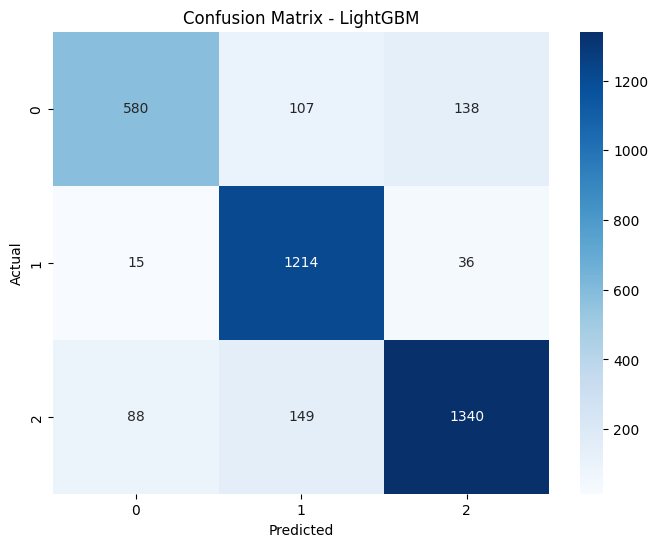

In [17]:
# Extract parameters from the best trial
best_params = best_trial.params

# Initialize the model using the best trial parameters with unpacking (**)
model = lgb.LGBMClassifier(
                          objective='multiclass',   # Multi-class classification objective
                          num_class=3,              # Number of classes
                          random_state=42, **best_trial.params)

# Train the model on the resampled training data
model.fit(X_train_combined, y_train)

# Predictions on the test set
y_test_pred = model.predict(X_test_combined)

# Log classification metrics
classification_rep = classification_report(y_test, y_test_pred, output_dict=True)
accuracy = accuracy_score(y_test, y_test_pred)

# Generate and log confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - LightGBM")

In [ ]:
import re
import numpy as np

# Assuming you have pre-trained tfidf_vectorizer and lgbm_model loaded
# tfidf_vectorizer: Your trained TF-IDF vectorizer
# lgbm_model: Your trained LightGBM model

# Function to clean and preprocess a YouTube comment (same as used during training)
def preprocess_comment(comment):
    # Lowercasing
    comment = comment.lower()

    # Remove special characters, URLs, punctuation, and extra spaces
    comment = re.sub(r"http\S+|www\S+|https\S+", '', comment, flags=re.MULTILINE)  # Remove URLs
    comment = re.sub(r'\W', ' ', comment)  # Remove special characters
    comment = re.sub(r'\s+', ' ', comment).strip()  # Remove extra spaces and newlines

    return comment

# Prediction function
def predict_sentiment(comment, tfidf_vectorizer, lgbm_model):
    # Step 1: Preprocess the YouTube comment
    cleaned_comment = preprocess_comment(comment)

    # Step 2: Transform the comment using the trained TF-IDF vectorizer
    comment_tfidf = tfidf_vectorizer.transform([cleaned_comment])

    # Step 3: Use the trained LightGBM model to predict the sentiment
    prediction = model.predict(comment_tfidf)
    prediction_proba = model.predict_proba(comment_tfidf)

    # Step 4: Get the predicted sentiment (label) and probability
    sentiment_class = np.argmax(prediction_proba)
    sentiment_proba = np.max(prediction_proba)

    # Step 5: Return the sentiment label and confidence
    return {
        'sentiment_class': int(prediction[0]),  # -1, 0, or 1 depending on your labels
        'confidence': sentiment_proba
    }

# Example usage:
comment1 = "I absolutely hate this video!"
comment2 = "The explanations were confusing and the video quality was poor."
comment3 = "I didn’t learn anything useful. Really disappointed."
comment4 = "Wow, the explanation was so clear and helpful. Definitely subscribing!"
comment5 = "This is the worst video I’ve seen on this topic, very misleading"
comment6 = "Not much to say about this, just a standard video."
comment7 = "The video is okay, but I expected more depth in the content."
comment8 = "Superb content! Mazaa aa gaya dekh ke. Best video on this topic!"
comment9 = "Poor video quality aur explanation bhi weak tha."
comment10 = "Yeh video theek tha, but I was expecting more depth."
result = predict_sentiment(comment10, tfidf_cleaned, best_model)
print(f"Predicted Sentiment: {result['sentiment_class']}, Confidence: {result['confidence']}")

Predicted Sentiment: 0, Confidence: 0.7993257111935146
